<a href="https://colab.research.google.com/github/guptaviha/ML-Image-Colorization-Study/blob/main/3_0_ML_Comparison_of_Colorization_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Topic: Image Colorization - A Comparitive Study



### Submission by

Name: **Disha Lamba**

Netid: dl4747

Name: **Viha Gupta**

Netid: vg2237

## The Three Models Under Study

Colorization of grayscale images is an ill-posed problem, with multiple correct solutions. Although important progress has been made in this field, over the time multiple models have been implemented to solve this problem which have been improvised over the time.

Previously, Scribble based methods were used where similar color was given to adjacent pixel with similar luminance where a lot of user interaction was required. Next, we had Example based methods where a refrence image was taken from the user or from the internet to color the input image. Over the time, researchers made significant improvement in this subject area and then we had CNN based models where algos were trained in such a way that human intervention or a refrence image was not required. Good traing of the model was only required.

For our project, we have studied 3 models in detail:

1. **Deoldify** [1] [2] [3] [4] [5]

2. **Instance-Aware Image Colorization** [6] [7] [8] [9] [10] [35] [36]

3. **ChromaGAN** [11] [12] [13] [14] [15] [16] [31] [32] [33] [34] 


## Model 1: DeOldify

### Architecture

The discussion in this section is based on the material found in [1] [2] and [3] as well as the understanding gained from the video [36]

Based on a Self - Attention GAN (**SAGAN**) except the generator is a custom U-Net (**DynamicUnet**) with pretrained resnet backbone. The deviations from standard U-Nets include self-attention, spectral normalization and Two Time-Scale Update Rule (TTSU):
* **Self-Attention** - details can be generated using cues from all feature locations and check that they are consistent throughout the image
* **Spectral Normalization** - added to make the model more robust and less sensitive to noise in input i.e. similar input images should have similar outputs.
* **Two Time-Scale Update Rule** - simply using different learning rate for both discriminator and generator. modified to incorporate a "threshold" critic loss that makes sure that the critic is "caught up" before moving on to generator training (useful for NoGAN training) DynamicUnet, developed by Fast.AI, has key features like cross connections from encoder to decoder, learnable blur, and pixel shuffle

**Loss functions**: First, Generator uses Perceptual Loss (or Feature Loss) based on VGG16 - biases the generator model to replicate the input image. Critic uses a loss score. Note: Perceptual Loss works best in comparison to L1 and Mean Squared Error (MSE) loss because these tend to “play it safe” and bet on gray and brown by default.

**Training:** Trained using NoGAN training on ImageNet dataset (converted to b&w, added random contrast, brightness, and gaussian noise augmentation.

### NoGAN?

Why do we want to use GANs? for generating realistic images

So what is the problem? Take a lot of time, are unpredictable.

What is NoGAN - new and effective way to do GAN training. Takes much less time and helps with image stability by eliminating side effects of flickering colors in video

![deoldify-arch](https://drive.google.com/uc?id=1NOZZ06VpaZxl3tT0-xjCzvPAJHqxzA5k)


**NoGAN Training Process:** [2]

1. Pretrain the Generator. The generator is first trained in a more conventional and easier to control manner - with Perceptual Loss. GAN training is not introduced yet. Colorization will be well-trained as a task, albeit the colors will tend toward dull tones. Self-Attention will also be well-trained at the at this stage.
2. Pretrain the Critic as a Binary Classifier. Training the critic as a binary classifier of real and fake images, with the fake images being those saved in the previous step. We can simply use a pre-trained critic used for another imaging task and then fine-tune it to refine it
3. Train Generator and Critic in (Almost) Normal GAN Setting. Quickly! The critic will rapidly drive adjustments in the generator during GAN training. This happens during a narrow window of time before an “inflection point” is hit. After this point, there is little to no benefit in training any further (will start seeing glitches introduced in renderings)
* use of a loss threshold that must be met by the critic before generator training commences. Until then, the critic continues training to “catch up” in order to be able to provide the generator with constructive gradients. This catch up chiefly takes place at the beginning of GAN training which immediately follows generator and critic pretraining.
* training to this point requires iterating through only about 1% to 3% of ImageNet data (or roughly 2600 to 7800 iterations on a batch size of five). This amounts to just around 30-90 minutes of GAN training. The “artistic” and “stable” models go one step further and repeat the NoGAN training process steps 2-4 until there’s no more apparent benefit (around five repeats).


![deoldify-graph](https://drive.google.com/uc?id=1ysXhfUMuy5M0CDH5HJ_dAQooQSoGefVs)

*Image Courtesy Deoldify Video [3]*

### Experimental details [3]
**Stats:**

Overall training time = Approx 50 hrs

Time to test image = 1 min for Artistic, 2 min for Stable

**Hyperparameters**

Learning rate = 5e-6 (to make it easier to find the inflection point)

Batch size = 5 (with batch normalization)

### The Two Variants of DeOldify Image [2]

**Artistic**
* Highest details and vibrance but needs fine tuning of render resolution and factor.
* Not as good as Stable for nature scenes and portraits uses resnet34 backbone on a UNet with an emphasis on depth of layers (number of layers) on the decoder side. (1.5 times the number of layers over the standard DynamicUnet configuration)
* Additionally trained with 5 critic pretrain/GAN cycle repeats via NoGAN. (total of 32% of Imagenet data trained i.e. 12.5 hours of direct GAN training).

**Stable**
* Best results with landscapes and portraits (less instances where faces or limbs stay gray)
* Generally less colorful but has less weird miscolorations than artistic uses a resnet101 backbone on a UNet with an emphasis on width of layers (number of filters) on the decoder side. (in the latest iteration, was set to a width of 1000 filters on the decoder side for most of the layers)
* Additionally trained with 3 critic pretrain/GAN cycle repeats via NoGAN. (total of 7% of Imagenet data trained i.e. 3 hours of direct GAN training).



### Pros and Cons
**Pros**
* Can work on images and videos [29]
* Easy to use free API [1]
* Produces vibrant and detailed colored images [3]

**Cons**
* Difficult to find an early stopping point before the inflection point. Right now, the determination of the inflection point is a manual process, and consists of a person visually assessing the generated images at model checkpoints. These checkpoints need to be saved at an interval of least every 0.1% of total data—otherwise, it is easily missed. This is definitely tedious, and prone to error. [2]
* Suffers from context confusion due to the lack of clear figure-ground separation [7]


### Replicated Deoldify Demo (Artistic)

Now let's demo the Deoldify Artistic Model. This entire section has been borrowed from the official Deoldify Colab and all credit goes to them for all their hardwork.[4] Here we run the model over an image of a ladybug [21]. This image is taken from the internet. A detailed explanation of the results can be found in the following results section.

The colab notebooks on Deoldify as provided by FastAI work by taking an input image as a url. So in order to run our tests, we took our curated set of original images (converted them to black and white if not already) and uploaded them to the site Imgur [30]. We then entered this url into the model and downloaded the final result. 

*Original ladybug Image Courtesy [21]*

Black/White ladybug image url: https://i.imgur.com/qsxCGbc.jpg

####◢ DeOldify - Colorize your own photos!

#####**Credits:**

Special thanks to:

Matt Robinson and María Benavente for pioneering the DeOldify image colab notebook.  

Dana Kelley for doing things, breaking stuff & having an opinion on everything.



---


####◢ Verify Correct Runtime Settings

**<font color='#FF000'> IMPORTANT </font>**

In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:
* Runtime Type = Python 3
* Hardware Accelerator = GPU 

####◢ Git clone and install DeOldify

In [ ]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 2327, done.
remote: Counting objects: 100% (99/99), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 2327 (delta 47), reused 27 (delta 10), pack-reused 2228
Receiving objects: 100% (2327/2327), 69.46 MiB | 28.31 MiB/s, done.
Resolving deltas: 100% (1055/1055), done.


In [ ]:
cd DeOldify

/content/DeOldify


####◢ Setup

In [ ]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [ ]:
!pip install -r colab_requirements.txt

     |████████████████████████████████| 214 kB 5.2 MB/s 
     |████████████████████████████████| 129 kB 39.3 MB/s 
     |████████████████████████████████| 1.9 MB 16.8 MB/s 
     |████████████████████████████████| 78 kB 7.0 MB/s 
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26324 sha256=3a1d9f72d9d37b033ea8808d411c83e23e100334a7d69768d168ebab21b7f302
  Stored in directory: /root/.cache/pip/wheels/35/f3/15/01aa6571f0a72ee6ae7b827c1491c37a1f72d686fd22b43b0e
Successfully built typing
  Attempting uninstall: fastai
    Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [ ]:
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

In [ ]:
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

--2021-12-14 00:33:50--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 138.201.36.183
Connecting to data.deepai.org (data.deepai.org)|138.201.36.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  26.7MB/s    in 10s     

2021-12-14 00:34:01 (24.2 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [ ]:
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2021-12-14 00:34:01--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2021-12-14 00:34:01 (58.6 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [ ]:
colorizer = get_image_colorizer(artistic=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

####◢ Instructions

#### source_url
Type in a url to a direct link of an image.  Usually that means they'll end in .png, .jpg, etc. NOTE: If you want to use your own image, upload it first to a site like Imgur. 

#### render_factor
The default value of 35 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the image is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality images in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality images, but the colors may get slightly washed out. 

#### watermarked
Selected by default, this places a watermark icon of a palette at the bottom left corner of the image.  This is intended to be a standard way to convey to others viewing the image that it is colorized by AI. We want to help promote this as a standard, especially as the technology continues to improve and the distinction between real and fake becomes harder to discern. This palette watermark practice was initiated and lead by the company MyHeritage in the MyHeritage In Color feature (which uses a newer version of DeOldify than what you're using here).

#### How to Download a Copy
Simply right click on the displayed image and click "Save image as..."!

#### Pro Tips

You can evaluate how well the image is rendered at each render_factor by using the code at the bottom (that cell under "See how well render_factor values perform on a frame here"). 

####◢ Colorize!!

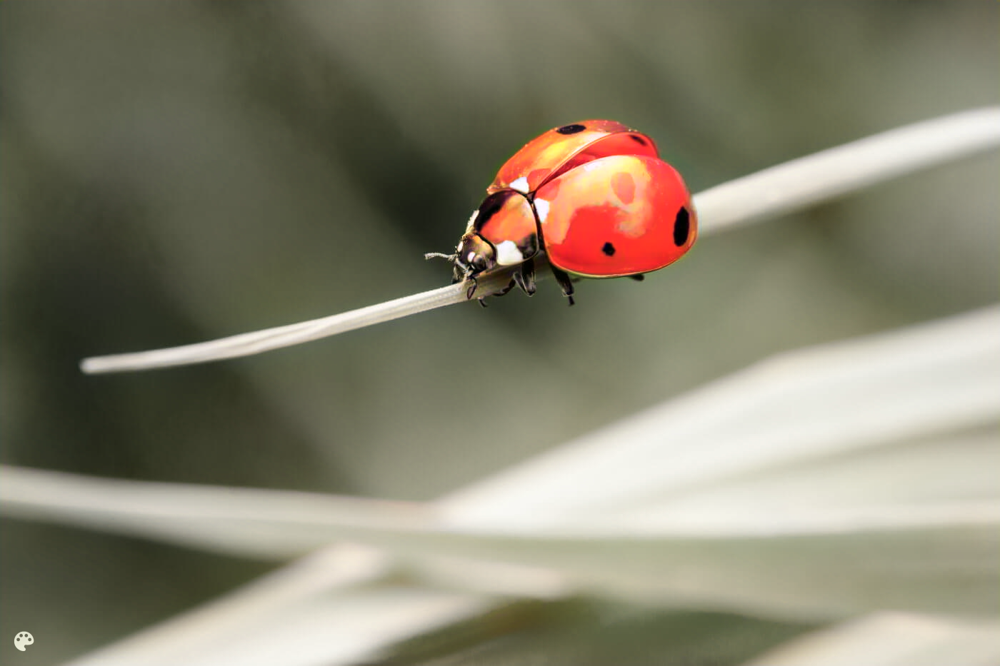

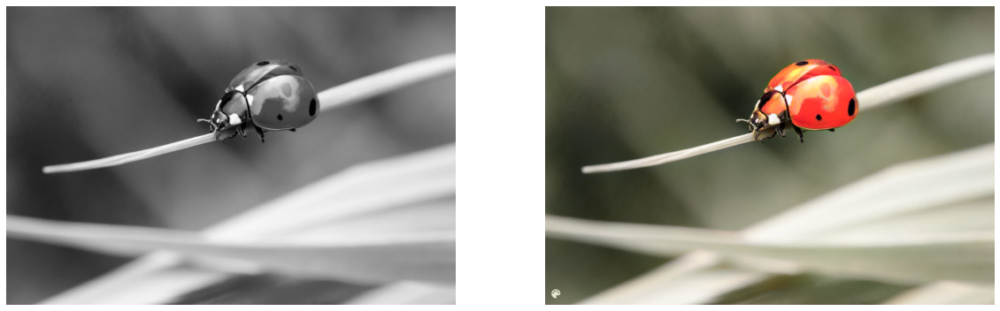

In [ ]:
source_url = 'https://i.imgur.com/qsxCGbc.jpg' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

### Replicated Deoldify Demo (Stable)

Here we have a look at the Stable release of Deoldify. This section too has been borrowed from the official Deoldify Colab.[5] Certain code cells have been removed from the original due to duplication with the Artistic model above. 

For this demo we have performed the same test as outline above for the ladybug image.

####◢ Setup

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
!wget https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

--2021-12-14 00:34:39--  https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth [following]
--2021-12-14 00:34:39--  https://www.dropbox.com/s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc89b5c49a2439361b8b35d3442c.dl.dropboxusercontent.com/cd/0/inline/BbzIO8wlDNpW2BRDoA73fVzQBhCc-r_R_8i700d2zSGcgcjc6F4OFFQwTi8PQ_MUcPza-VoeJZy0hxUL2i7c8WqxmSLVPt8LD1Svi-OZQZXf1z01hTf7VsCuoqZ4H-57Dkz2EkKPHhKYqUWx_VwNw9f8/file# [following]
--2021-12-14 00:34:39--  https://uc89b5c49a2439361b8b35d3442c.dl.dropboxusercontent.com/cd/0/inline/BbzIO8wlDNpW2BRDoA73fVzQBhCc-r_R_8i700d2zSGcgcjc6F4OFFQ

In [ ]:
colorizer = get_image_colorizer(artistic=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

####◢ Colorize!!

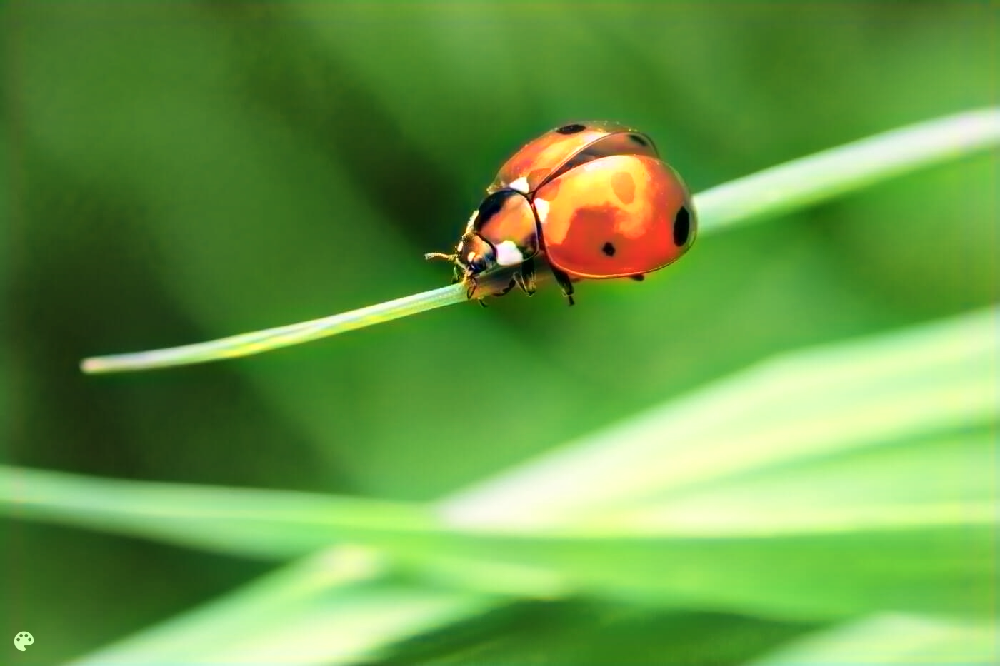

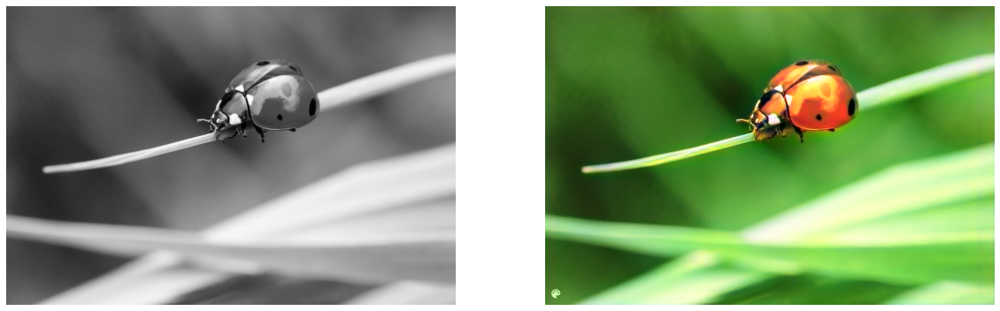

In [ ]:
source_url = 'https://i.imgur.com/qsxCGbc.jpg' #@param {type:"string"}
render_factor = 12  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

## Model 2: Instance-aware Image Colorization



*To understand the model better, we looked over [35], [36] to understand the model better and get an overview.*

**Basic Overview:**

Previous methods like scribble-based, learning-based colourization usually failed on the images that contain multiple objects and the leading cause for that was that these methods perform learning and colurization on the entire image. And thus in the absense of a clear figure-ground sepration, these models cannot effectively locate and learn meaningful object-level semantics.

While, in the case of Instance-aware colorization, we use off-the-shelf object detector to obtain cropped images and use instance and full image colourization to extract object-level features and then apply a fussion module to predict the final color.

### Architecture [8]:
![architecture](https://drive.google.com/uc?export=view&id=1sVDY2F1EzRGH8hP1tQGkjm0qWTMh_mKJ)

*We have created this architecture for our own test sample image [24] with the help of architecture provided in the paper [7] and blog [35].* 

### Methodology [7]:
*The methodology has been studied from the paper [7] and blog [35]*

* First, from the input image 'X' we obtain off-the-shelf pre-trained object detector to obtain multiple object bounding boxes i.e getting multiple instaces,  $𝐵_i^N$. This gives us intresting elements from the input image i.e  $𝑋_𝑖$ which are then colorized one by one. But by this, we haven't colorized the entire image, some part of it remains black and white.


* So as a remedy, we colorize the entire image independently. Both of the of instace colorization network, 
$𝑓_j^X$ and full-image colorizatin network,  $𝑓_j^X$, have the same network but have different weights.

* But now somethings are colorized twice and they have different colors. Therefore, we introduce fusion module which will stitch these overlapping results into one coherent output. 

* In the fusion module, we fuse these images based upon the bounding box $𝐵_𝑖$ which defines the size and location of any instance. We resize the instance feature and weight map, $𝑊_𝐹$ , and match it to the full image with zero padding.

* Next, we apply softmax funtion on each pixel obtained from instance image and full-image which gives us complete colored image.

### Loss Function [7]:
$𝑓^𝑋_𝑗$ = $𝑓_𝑋^𝑗$ *  $𝑊_𝐹$ +  $∑^𝑁_i$ $𝑓^𝑋_𝑗$ * $𝑊^𝑖_𝐼$   [7]

where,

first term is first network for full image features and second term is for second network for instance image features and the result is full colored image by fused module.


### Experimental Details [7]:
1. Datasets used: Imagenet, Coco-stuff, Places205

2. First network (Full image colourization netwrok)

* Intialized with pre trained weights
* Learning rate: 1e-5
* Epochs = 2

3. Second Network (Instance aware colourization network)

* Start with pre trained weights and then we fine tune them
* Learning rate: 5e-5
* Epochs = 5

4. Fusion Module

* Optimizer used: Adam Optimizer
* Learning rate: 2e-5
* Number of channels: 13
* Image size: 256 * 256


### Quantitative Analysis [7]:
For observations and results, Human Tuning test was perforemd. 100 images were taken and 24 participants were asked to cast vote that how realistic the images are.

**Prediction Time:** 0.187 sec for a Intel I9 processor with 32GB RAM computer.


### Pros and Cons
**Pros**
* Doesn't have user-intervention
* Doesn't use refrence image for colourisation i.e. it is a Parametric Model
* Quite good with maintaining the translucency within objects. For example in fruits like grapes. [7] [36]
* Quite appropriately distinguishes between objects and backgrounds. Doesn't overlap them.

**Cons**
* Doesn't work if we have a colour burst picture. As it not able to extract instances properly. [7]
* Doesn't work well for landscape images.
* Fails for bright, vibrant colours.
* Its output is highly dependent on object-detection. If it fails, we'll have full-image colorization output. 


### Replicated Instace-Aware Code [6][10]:

*The Colab notebook ran completely fine in first go. Only changes we made were for our extension i.e testing our test samples.*

Comments have been added in each cell so as to understand what is exactly going in the code and what changes have been made by us for our testing. 





#### Import and Setup

In [ ]:
#Imports and Setup
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html -q
!pip install cython pyyaml==5.1 -q
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI' -q
!pip install dominate==2.4.0 -q
!pip install detectron2==0.1.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html -q

     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 27.2 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.3 MB/s 
     |████████████████████████████████| 6.3 MB 780 kB/s 
     |████████████████████████████████| 49 kB 4.0 MB/s 


#### Clone the file and Download the model 





In [ ]:
#Clone the file from GitHub
!git clone https://github.com/ericsujw/InstColorization.git

Cloning into 'InstColorization'...
remote: Enumerating objects: 211, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 211 (delta 15), reused 11 (delta 11), pack-reused 177
Receiving objects: 100% (211/211), 6.11 MiB | 21.35 MiB/s, done.
Resolving deltas: 100% (82/82), done.


In [ ]:
cd InstColorization/

/content/InstColorization


In [ ]:
#Downloading the model
!sh scripts/download_model.sh

Downloading...
Finish download.
Archive:  checkpoints.zip
   creating: checkpoints/coco_finetuned_mask_256_ffs/
  inflating: checkpoints/coco_finetuned_mask_256_ffs/latest_net_GComp.pth  
  inflating: checkpoints/coco_finetuned_mask_256_ffs/latest_net_G.pth  
  inflating: checkpoints/coco_finetuned_mask_256_ffs/latest_net_GF.pth  
   creating: checkpoints/coco_finetuned_mask_256/
  inflating: checkpoints/coco_finetuned_mask_256/latest_net_GComp.pth  
  inflating: checkpoints/coco_finetuned_mask_256/latest_net_G.pth  
  inflating: checkpoints/coco_finetuned_mask_256/latest_net_GF.pth  
   creating: checkpoints/siggraph_retrained/
  inflating: checkpoints/siggraph_retrained/latest_net_G.pth  


#### Detect Object Bounding Box

In [ ]:
from os.path import join, isfile, isdir
from os import listdir
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from argparse import ArgumentParser

#detectron2 library is used for object detection
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import cv2

# importing some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

import torch

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)

model_final_2d9806.pkl: 431MB [00:12, 34.6MB/s]                           


Creating a new folder - **example_bbox** which saves bounding boxes predictions. 

In example_bbox folder we have .npz files. Each file has respective images bounding each box shape. The shape parameter helps the fusion model know where a particular box is located so that it can fuse Instance and full-image colorization model features.


In [ ]:
#Taking Input images (X) and creating bounding boxes X_i for each image
input_dir = "example"
image_list = [f for f in listdir(input_dir) if isfile(join(input_dir, f))]
output_npz_dir = "{0}_bbox".format(input_dir)
if os.path.isdir(output_npz_dir) is False:
    print('Create path: {0}'.format(output_npz_dir))
    os.makedirs(output_npz_dir)

Create path: example_bbox


CIE L*a*b color space is used for colorisation. We simply take L channel as our input and make sure that we can get consistent box prediction results even though the original image is color images.


In [ ]:
for image_path in image_list:
    img = cv2.imread(join(input_dir, image_path))
    lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab_image)
    l_stack = np.stack([l_channel, l_channel, l_channel], axis=2)
    outputs = predictor(l_stack)
    save_path = join(output_npz_dir, image_path.split('.')[0])
    pred_bbox = outputs["instances"].pred_boxes.to(torch.device('cpu')).tensor.numpy()
    pred_scores = outputs["instances"].scores.cpu().data.numpy()
    np.savez(save_path, bbox = pred_bbox, scores = pred_scores)

Bounding box prediction results.

For our extension we have added our 15 samples to example folder to get our test results. These 15 files have bounding box prediction. 

In [ ]:
!ls example_bbox

albert_bw.npz	   ladybug_bw.npz	       portrait_bw.npz	veggies2_bw.npz
colorburst_bw.npz  landscape_bw.npz	       santa_bw.npz	view_bw.npz
flame_bw.npz	   livingroom_bw_original.npz  skyline2_bw.npz	zebra_bw.npz
flowers_bw.npz	   people_bw_original.npz      tree_bw.npz


#### Colorize Images

Setting up **libraries**

In [ ]:
import sys
import time
from options.train_options import TestOptions
from models import create_model

import torch
from tqdm import tqdm_notebook

from fusion_dataset import Fusion_Testing_Dataset
from util import util
import multiprocessing
multiprocessing.set_start_method('spawn', True)

torch.backends.cudnn.benchmark = True

sys.argv = [sys.argv[0]]
opt = TestOptions().parse()

Next, we create a **results** folder to save our predicted images and read the database loader. 




In [ ]:
save_img_path = opt.results_img_dir
if os.path.isdir(save_img_path) is False:
    print('Create path: {0}'.format(save_img_path))
    os.makedirs(save_img_path)
opt.batch_size = 1
dataset = Fusion_Testing_Dataset(opt, -1)
dataset_loader = torch.utils.data.DataLoader(dataset, batch_size=opt.batch_size)

dataset_size = len(dataset)
print('#Testing images = %d' % dataset_size)

Create path: results
#Testing images = 15


Loading pre-trained model

In [ ]:
model = create_model(opt)
model.setup_to_test('coco_finetuned_mask_256_ffs')

initialize network with normal
initialize network with normal
initialize network with normal
model [FusionModel] was created
load Fusion model from checkpoints/coco_finetuned_mask_256_ffs/latest_net_GF.pth


In [ ]:
count_empty = 0

#Case 1: When we have bounding boxes for our input image
for data_raw in tqdm_notebook(dataset_loader):
    data_raw['full_img'][0] = data_raw['full_img'][0].cuda()
    if data_raw['empty_box'][0] == 0:
        data_raw['cropped_img'][0] = data_raw['cropped_img'][0].cuda()
        box_info = data_raw['box_info'][0]
        box_info_2x = data_raw['box_info_2x'][0]
        box_info_4x = data_raw['box_info_4x'][0]
        box_info_8x = data_raw['box_info_8x'][0]
        #Instace-Aware colorization
        cropped_data = util.get_colorization_data(data_raw['cropped_img'], opt, ab_thresh=0, p=opt.sample_p)
        #Full-Image colorization
        full_img_data = util.get_colorization_data(data_raw['full_img'], opt, ab_thresh=0, p=opt.sample_p)
        model.set_input(cropped_data)
        #Fusion model. We fuse full image output and cropped images output.
        model.set_fusion_input(full_img_data, [box_info, box_info_2x, box_info_4x, box_info_8x])
        model.forward()

#Case 2: When we don't have bounding boxes for our input image
    else:
        count_empty += 1
        #We simply colorize the image using full-image colorization model
        full_img_data = util.get_colorization_data(data_raw['full_img'], opt, ab_thresh=0, p=opt.sample_p)
        model.set_forward_without_box(full_img_data)
    model.save_current_imgs(join(save_img_path, data_raw['file_id'][0] + '.png'))
print('{0} images without bounding boxes'.format(count_empty))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


3 images without bounding boxes


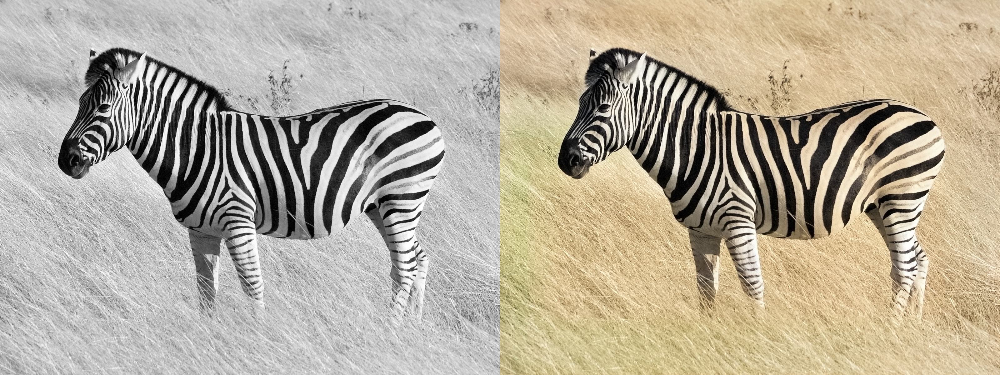

In [ ]:
from google.colab.patches import cv2_imshow

#Our test samples
img_name_list = ['albert_bw', 'colorburst_bw', 'flame_bw', 'flowers_bw', 'ladybug_bw', 'landscape_bw',
                 'livingroom_bw_original', 'people_bw_original', 'portrait_bw', 'santa_bw', 'skyline2_bw',
                 'tree_bw', 'veggies2_bw', 'view_bw', 'zebra_bw']

#Input image index
show_index = 14

#Some images are 'jpeg', 'jpg'. Comment accordingly

img = cv2.imread('example/'+img_name_list[show_index]+'.jpeg')
#img = cv2.imread('example/'+img_name_list[show_index]+'.jpg')

#We pass our imput image through CIE L*a*b color space
lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l_channel, _, _ = cv2.split(lab_image)

#We save out final output in results folder.
img = cv2.imread('results/'+img_name_list[show_index]+'.png')
lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
_, a_pred, b_pred = cv2.split(lab_image)

#Resizing a,b channels 
a_pred = cv2.resize(a_pred, (l_channel.shape[1], l_channel.shape[0]))
b_pred = cv2.resize(b_pred, (l_channel.shape[1], l_channel.shape[0]))
gray_color = np.ones_like(a_pred) * 128

gray_image = cv2.cvtColor(np.stack([l_channel, gray_color, gray_color], 2), cv2.COLOR_LAB2BGR)
color_image = cv2.cvtColor(np.stack([l_channel, a_pred, b_pred], 2), cv2.COLOR_LAB2BGR)

cv2.imwrite('results_origin/'+img_name_list[show_index]+'.png', color_image)

cv2_imshow(np.concatenate([gray_image, color_image], 1))

*Image courtesy - Zebra [28]*

## Model 3: ChromaGAN: Adversarial picture colorization with semantic class distribution

*The discussion about ChromaGAN is based upon its paper [12] so as to understand its architecture, [31], [32], [33]and [34] to learn about the concepts of WGAN, VGG16 and PatchGAN respectively.*

ChromaGAN, is a GAN based approach but with a little twist to it which makes this model suitable for image colorization.

**WGAN** [31]

First, it uses **WGAN** (Wasserstein GAN) which avoids GAN losses like vanishing gradient descent, non-convergence (Generator doesn't really converge after a large dataset because of n number of features, poor training etc.) and mode-collapse (Generator only outputs single image maybe because the generator has learned itself on a specific feature)

**VGG16 for Generator** [32][33]

Second, for the generator we are using **VGG-16** architecture which is a 16 layer CNN. How's it better than other architecture? It has less number of hyperparameters, i.e. having fix max-pooling layer, stride and filter size.

**PatchGAN for Discriminator** [34]

Ans lastly, we use **PatchGAN** for Discriminator. Now, how PatchGAN is different from GAN? Simply, a PatchGAN instead of mapping input image to single scalar output as in GANs, it maps input image to an NxN array output i.e. every individual NxN output is mapped to a patch in the input image. It's advantage is that it can work with arbitrary sized images. 

### Architecture [12]:
![architecture](https://drive.google.com/uc?export=view&id=178iO_sdCdHATOeZxBg1ARjJjdjhXtVhm)


*Image courtesy from ChromaGAN paper [12]*

Generator(Yellow, Red, Purple) uses VGG16(Visual Graphics Group 16) which has 16 layers (13 CNN layers and 3 fully connected layers).

Discriminator(Green) uses PatchGAN which maps input image to an N*N array output i.e. a patch from an image. 


### Approach [12]:
The conversion of grayscale image L takes place in three steps, first two steps belong to generator, focus on geometrically and semantically generating a color image information (a,b) and classifying its semantic content. The third steps belongs to discriminator network learning to distinguish between real and fake data. 

Given, a grayscale image L, we learn its mapping by,

G : L --> (a,b) where L*a*b* are three chrominance chanel images in the CIE Lab color space, where,

G = Adversarial learning

L* = perceptual lightness

a*, b* = the four unique colors of human vision: red, green, blue, and yellow 

Here the generator predicts the (a,b) channels

In parallel, a discriminator evaluates how realistic is the proposed image.

### Loss function [12]:

L($G_θ$ , $D_w$) = $L_e$($G_θ^1$) + $λ_g$$L_g$($G_θ^1$ , $D_w$) + $λ_g$$L_s$($G_θ^2$)  [12]

Where,

First term denotes the color error loss, by this we learn a per-pixel color probability 

Second term denotes WGAN loss.

Third term is class distribution loss

### Experimental Deatils [12]:
1. Dataset - ImageNet

2. Model Training
* Optimizer - Adam optimizer
* Learning rate - 2e-5
* Epochs - 5
* Batch size - 10 and a single epoch takes 23hrs on a NVIDA Quadro P6000 GPU
* Prediction Time: 4.4ms









### Pros and Cons
**Pros**
* Doesn't have user-intervention
* Doesn't use refrence image for colourisation i.e. it is a Parametric Model
* Works very well for historic images
* Warm colors

**Cons**

* GANs can be difficult to train
* Very large training time required. In this case 23hrs training time was required
* For such high training, we definitely need high GPU power, which not everyone has.
* Color bleeding. In some images, object color is overlapped with background.
* Doesn't work for Colorburst pictures.

### Replicated ChromaGAN code [15][16]:

*For the code replication we have studied Colab code [15] and used online tool [16] provided by them to colorize the images*

For the results, we have used online ChromaGAN tool [16].

![ChromaGAN-online-tool](https://drive.google.com/uc?export=view&id=1lZBOcOH3kWUfI6_m8KmqOEFY863iH8hf)

*Image courtesy - Albert Einstein [17]*

Note - We tried debugging the ChromaGAN Colab Notebook but there was some error in it. Therefore, we went with this online tool provided by them to get our test results.




## Extension:

### Comparative Study:


### Methodology:

We obtained 11 images from the internet and used an addition 4 of our own images. These images, which we will refer to as the "originals" or "ground truth", may be colored or black and white. For images that are originally in color, we converted first to black and white using the below python script on our local machines.

```
from PIL import Image
import numpy as np
import math
import sys

test_ip_image = sys.argv[1]
ip_im = Image.open('/Users/viha/Downloads/Originals/'+test_ip_image,mode='r')
l_bw = ip_im.convert("L")
l_bw.save('/Users/viha/Downloads/'+'bw_' + test_ip_image, format= 'JPEG')
```

We will go through each of our results individually. A comprehensive chart of all images can also be found at the link below:

https://docs.google.com/document/d/1qDUPz6-3W1gltaeddA9bFIDqVAEAkukiW65oORebJU8/edit?usp=sharing

#### Outlier case: **Colorburst Image**

![Colorburst Results](https://drive.google.com/uc?id=1-157sOfHj6V9m3564_QC1my2ZBgJGE0j)

*Image Courtesy [18]*

Explanation: Here is a colorful colorburst image. After converting to black and white, can the models recolorize the image correctly? As we can see, each one of our models struggle and fail to color the object because of various possibilities. Deoldify stable gives an arbitary red color while Instance-Aware and ChromaGAN colorize with a dirty sand color.

#### **Zebra Image**

![Zebra Results](https://drive.google.com/uc?id=14dMH5TcbEUbilKaw2OEvJBmelGK6KIMf)

*Image Courtesy [28]*

Explanation: The choice of an image of a zebra was an interesting one. We wanted to see what would happen if we feed a black and white image of an object that is meant to be black and white. We can see that all the models have successfully (not) colorized the zebra. We suspect this may because in terms of training images, a zebra is a uniquely identifiable object with no color ambiguity - all zebras have the same color unlike bears that may be black, brown, or white in color. 

But if you notice, Instance-Aware has colorized the black and white image closest to the original colored image and this is due to the object dection ability.

#### Outlier case: **Flowers Image**

![Flowers Results](https://drive.google.com/uc?id=1uimesal0x04NAiBd13QFWi6I42yk-4ir)

*This is our own image.*

Explanation: Deoldify, Instace-Aware have colorized the pink roses as yellow. This is because of the various color possibilities - red, white, yellow, purple, etc color roses. 

One intresting result here to notice here is that of ChromaGAN in which we can clearly see color-bleeding. The pink color of the roses is being mixed with the background while this is not the case with the other two models. We suspect, this is because of the high GAN training and no object detection model being implemented in ChromaGAN. 

#### Outlier Case: **Santa Image**

![Santa Results](https://drive.google.com/uc?id=1TP6oe4h5VWAlyja5PEYZQkKp1Cem5xJ9)

*This is our own image.*

Explanation: This is another example where we see in color-bleeding of color red in the ChromGAN result because of the red color of santas. 

We can also see, Deoldify-Artistic and Instace-Aware were able to colorize the santas red to some extent but not the background. 

#### Outlier case: **View Image**

![View Results](https://drive.google.com/uc?id=1-w2gxtxBttyVZtg1x1F8_9mEwuTo0c6Y)

*This is our own image.*

Explanation: The original image here is that of a red colored tree as can be seen all over the city during Fall time. However, each model colorizes the tree green. Why is this? Because the images that these models are trained with are of tree objects with the standard green color. They do not perform well for outlier cases like this one.



#### **Landscape Image**

![Landscape Results](https://drive.google.com/uc?id=1D4ut0kl7Oodo9vWvlgoYr4c-G73OCcIZ)

*Image Courtesy [22]*

Explanation: The only decent result we can observe here is in the case of ChromaGAN, it has very warm colors. 

#### Outlier case: **Veggies Image**

![Veggies Results](https://drive.google.com/uc?id=1ggI7PV3Jvbpc8iv9NLAekZGLvI8hfqnO)

*Image Courtesy [27]*

Explanation: This image has many intresting elements. Just look at how colorful this image and how many different objects are there. And because Instace-Aware is largely dependent upon object-detection it has colorized the vegetables closest to their original color. If you notice, raddish is colorized as yellow in Deoldify and ChromaGAN but only in Instace-Aware we can see raddish as red. And for the other vegetables, the colors are either dull, yellow or are not colorized (you can observe this for peas, tomatoes, apple) but this is not the case with Instace-Aware.  

#### **Flame Image**

![Flame Results](https://drive.google.com/uc?id=1g9zs-um7k_T7PlA68Ujije3V5vgpbLOU)

*Image Courtesy [20]*

Explanation: This example is a personal favorite. When shown to a group of people, the fake colorized image produced by Deoldify Stable is able to fool many in a human turing test. Look at how Instance-Aware performs in this example. It is heavily reliant on its ability to detect objects. In this low-light scene of a flame, it is seemingly unable to do so, resulting in a dull and multicolored candle whereas Deoldify stable produces a colorization that is even more bright and vibrant than the original. 

#### **Portrait Image**

![Portrait Results](https://drive.google.com/uc?id=1DQ-He2qDUewVFOUClpRfsQ4clh417mCq)

*Image Courtesy [25]*

Explanation: Colorizing portraits is a domain that Deoldify Stable excels at. Notice how in this example, Deoldify Artistic produces dull colors - likely due to the infamous instability of multiple GAN training cycles. ChromaGAN has extensive color bleeding as evident from the yellow tint in the hair. 

#### **Tree Image**

![Tree Results](https://drive.google.com/uc?id=1U2JvYN6mCzNg5bEB7cQSTfFfmrVUP8oA)

*This is our own image.*

Explanation: We wanted to test the models for a nighscape image. Only ChromaGAN and Instace-Aware gave decent results. None of the models performed well for a nightscape image, the colorful lights(red, green, blue) are colorized as white in the outputs.  

#### **Ladybug Image**

![Ladybug Results](https://drive.google.com/uc?id=1-oBZMEcq3GayVnM21PPrbr9WlgtmkyzA)

*Image Courtesy [21]*

Explanation: Another intresting sample, all of the models have colorized the ladybug well. While, Deoldify giving the closest color to the original ladybug color image. One result to notice here is that because of color-bleeding in ChromaGAN the complete image has greenish tint all over it, even the lady bug appears to be green in color. 

#### **Skyline Image**

![Skyline Results](https://drive.google.com/uc?id=1wP0Wzn3v0EoEMt6jBCkfWVnGc3Ni6N7T)

*Image Courtesy [26]*

Explanation: Another nightscape image we tested but with lots of minute details and no exact object detection. None of the models perfomed well, only the sky and ocean have been colorized well. Other highlights in the skyline like the Brooklyn Bridge has not been colorized at all. This is again one of the outlier case that models fail for nightscape images.

#### **Albert Image**

![Albert Results](https://drive.google.com/uc?id=1g7xfeOyNub1CPAPkCYFHUZApKLZcPdQb)

*Image Courtesy [17]*

**Explanation**: Here is a great example of how Deoldify leverages self-attention. If you look at the background ocean across each colored image, you can notice that the other models, i.e. ChromaGAN and Instance-Aware have inconsistent coloring. Notice how the part of the ocean between the two people is grey. The self-attention feature in both versions of Deoldify captures this global feature and provides a smooth consistent color to the object.

#### **People Image**

![People Results](https://drive.google.com/uc?id=1iTavR_jN393yyOucn8-1CXO8rCvYqIsT)

*Image Courtesy [24]*

Explanation: All of the models performed well for this historic - Thanksgiving Mashers (1911) image. But the best results can be seen in Deoldify and Instace-Aware. Instace-Aware performed really well for this image because of off-the-shelf object detection. 

In the image below, we can clearly see how perfectly it has detected the bounding box around the 5 kids well and the object-detection model has given them the same id as 0 and it has also detected the bounding box aroung the tie in the attire of the kids and has given it an id of 27.

![People-object-detection](https://drive.google.com/uc?id=11j_b8Zb91iPzbE59XjMP4luH47z1zc27)

By this and previous results we can say, Instace-Aware really works well for images that have clear object detection like people, vegetables, animals, etc. It sometimes fail when we don't have object-detection as then we are only colorizing the black-white image using only the full-image colorization network and not fusing other features. 





#### **Living Room Image**

![Livingroom Results](https://drive.google.com/uc?id=1z9aaoUU9CYJ4nLBHSImBBJ4n-VCaIVPN)

*Image Courtesy [23]*

Explanation: Another historic example we took of a living room where a lady is lying. In the Instace-Aware result, the model kind of mixed up the lady and the plant and couldn't perform well and thus the result is kind of blurred. It correctly detected the plant which is the leftmost corner therefore it has been colorized well while rest of the background and the objects are blurred, yellowish or balck-white. So this makes us conclude that how Instace-Aware is highly dependable on object-detection. 

### Application: Image Compression

Imagine, if we could develop an AI system for both mobile and web devices such that we wouldn't have to upload colored images over the internet, black-white photos will be fine to restore the colored images. And for this to work successfully, we need to ML Image Colorization model that colorizes the images perfectly irrespective of their original filter.

In the following Excel sheet, we have shown the compression factor for our 15 test samples. Out of which 3 were historic images so we haven't considered those images when calculating the compression factor. 

![Image-compression Excel sheet](https://drive.google.com/uc?export=view&id=12Nh_3eGrxCYeK81XS737oJmZ24aKxOqz)


In google photos we have a limit of 15GB. So imagine how much space this technique would save!

We know for a RGB image we need 24 bits = 768 values (intensities of light) but for a grayscale image we only need 8 bit = 256 values. Which means RGB takes upto thrice as much space as a grayscale image.

![Image-compression Excel sheet](https://drive.google.com/uc?export=view&id=1-PDZQSfv-mqCj-1kJ-gk1-ql0ScumhTO)

From the graph we can see that if we somehow develop a system like this we can save twice as much space. 8/12 images show a compression above 2.   






### Comparison Chart of the 3 models:

We have made these respective conclusions from our study about each model from their paper, blog, other online resoirces and then testing upon our test samples.

![conclusion](https://drive.google.com/uc?export=view&id=1twOKybaLmfAyGQhKJgTt0rJQqF5Wk00f)












##References

[1] Deoldify GitHub: https://github.com/jantic/DeOldify#about-deoldify

[2] Delodify Blog: https://www.fast.ai/2019/05/03/decrappify/

[3] Deoldify Video: https://www.fast.ai/2019/05/03/decrappify/

[4] Deoldify Colab Image (Artistic): https://colab.research.google.com/github/jantic/DeOldify/blob/master/ImageColorizerColab.ipynb?pli=1#scrollTo=KbIYfKoTLb5t

[5] Deoldify Colab Image (Stable): https://colab.research.google.com/github/jantic/DeOldify/blob/master/ImageColorizerColabStable.ipynb


[6] Instance-Aware Github: https://github.com/ericsujw/InstColorization


[7] Instance-Aware Paper: https://arxiv.org/pdf/2005.10825.pdf


[8] Instance-Aware Website: https://ericsujw.github.io/InstColorization/


[9] Instance-Aware Comparison: https://cgv.cs.nthu.edu.tw/InstColorization_data/Supplemental_Material/sup.html


[10] Instance-Aware Colab: https://colab.research.google.com/github/ericsujw/InstColorization/blob/master/InstColorization.ipynb?pli=1#scrollTo=_ftWuY5-6u9M

[12] ChromaGAN Paper: https://openaccess.thecvf.com/content_WACV_2020/papers/Vitoria_ChromaGAN_Adversarial_Picture_Colorization_with_Semantic_Class_Distribution_WACV_2020_paper.pdf

[13] ChromaGAN Video: https://www.youtube.com/watch?v=hrI-WTrZEgM&t=1804s

[14] ChromaGAN Github: https://github.com/pvitoria/ChromaGAN

[15] ChromaGAN Colab: https://colab.research.google.com/github/pvitoria/ChromaGAN/blob/master/DemoChromaGAN.ipynb

[16] ChromaGAN Online: https://replicate.com/pvitoria/chromagan

[17] Albert Einstein (1939): http://1.bp.blogspot.com/-e-qSxAhAxr4/U8GDBoCt4DI/AAAAAAAAJkY/PLtGwxImHd4/s1600/Einstein+at+the+beach,+1939+2.jpg

[18] Color Burst: https://9to5mac.com/wp-content/uploads/sites/6/2016/11/color-burst-2.jpg?quality=82&strip=all

[19] Fire cracker: https://in.pinterest.com/pin/394839092304295524/

[20] Flame: https://upload.wikimedia.org/wikipedia/commons/thumb/1/1c/Candle_flame_%281%29.jpg/1024px-Candle_flame_%281%29.jpg

[21] Ladybug: https://www.bughousepestcontrol.com/wp-content/uploads/2018/08/AdobeStock_184679416-1400x933.jpeg

[22] Landscape: http://www.oceangrowncanada.com/Landscaping.html

[23] 'Woman relaxing in her living room' (1920, Sweden): https://i.imgur.com/nDzcypF.jpg?fb

[24] People: https://i1.wp.com/racingnelliebly.com/wp-content/uploads/2017/11/2-window14928r.jpg?w=796&h=556&ssl=1

[25] Portrait: https://www.lebanoninapicture.com/pictures/portrait-time-people-faces-man-mustache-leaves-tree-old

[26] Skyline: https://pixels.com/featured/brooklyn-bridge-and-manhattan-skyline-new-york-usa-stefano-politi-markovina.html

[27] Veggies: https://scpr.brightspotcdn.com/dims4/default/26b5a73/2147483647/strip/true/crop/640x431+0+0/resize/1440x970!/quality/90/?url=http%3A%2F%2Fscpr-brightspot.s3.amazonaws.com%2Flegacy%2Fi%2F193d0e300c3244b3f490eaa7b4f70318%2F5b2a50550161a1000dd70e35-original.jpg

[28] Zebra: https://s3.amazonaws.com/hudsonalpha/wp-content/uploads/2020/03/31082714/Common_zebra_1.jpg

[29] Deoldify Colab Video: https://colab.research.google.com/github/jantic/DeOldify/blob/master/VideoColorizerColab.ipynb

[30] Imgur Upload Image: https://imgur.com/upload

[31] WGAN: https://paperswithcode.com/method/wgan

[32] VGG16: https://www.mygreatlearning.com/blog/introduction-to-vgg16/#VGG%2016%20Architecture

[33]: VGG16 video explanation: https://www.youtube.com/watch?v=YcmNIOyfdZQ

[34] PatchGAN: https://cs.paperswithcode.com/method/patchgan

[35] Instace-Aware Overview: https://wandb.ai/wandb/instacolorization/reports/Overview-Instance-Aware-Image-Colorization---VmlldzoyOTk3MDI

[36] Instace-Aware Video: https://www.youtube.com/watch?v=9UBQon9iFtY

[37] SAGAN Video: https://www.youtube.com/watch?v=v4y9zBrR4gY&t=284s

